# **EDA PISI3 - Grupo 02**
Nessa análise exploratória de dados, iremos explorar os dados brutos obitidos no dataset escolhido - Diabetes Health Indicators Dataset. Aqui, iremos entender e observar melhor os dados que possuímos, como manipular, modelar e entender o comportamento desses dados.

Link do dataset: https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset?resource=download&select=diabetes_012_health_indicators_BRFSS2015.csv



# Imports
Para essa análise, utilizaremos a biblioteca pandas


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as clu
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
import plotly.express as px


# Leitura e Escrita de Datasets

Nessa etapa, iremos receber os datasets e transforma-los em dataframes.


In [2]:

df_Diabetes = pd.read_csv('../DiabetesDataSet/diabetes_012_health_indicators_BRFSS2015.csv',low_memory=False)
pd.set_option('display.max_columns', 200)

# Observando o DataSet


In [3]:
#Nessa linha, podemos observar os 5 primeiros e 5 últimos registros
#Além disso, podemos verificar o número de linhas e colunas
display(df_Diabetes)

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,2.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,5.0,1.0


Verificando valores nulos e tipos de dados 

In [4]:
df_Diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

Diante disso, é possível verificar que todos os tipos de dados presentes no Dataset são do tipo float e são não nulos.

Outra verificação importante no tratamento dos dados é a quantidade de dados duplicados

In [5]:
print(df_Diabetes.duplicated().sum())

23899


Agora, vamos verificar informações estatísticas do Dataset


In [6]:
df_Diabetes.describe()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.296921,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,0.811420,0.056197,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875
std,0.698160,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,0.391175,0.230302,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


De acordo com a legenda fornecida no kaggle, o número 2 representa a diabetes na coluna Diabetes_012. Vamos verificar quantos registros de diabéticos temos. 

In [7]:
diabeticos = (df_Diabetes['Diabetes_012'] == 2).sum()
print("Casos de diabéticos = "+ str(diabeticos))


Casos de diabéticos = 35346


Diante desse caso, mostra necessidade de entender melhor sobre as colunas e realizar analises sobre elas


Vamos verificar a análise da coluna relacionada a Diabetes:

In [8]:
import plotly.express as px

# Definindo as cores padrão: vermelho para 'Sem Diabetes', cinza para 'Pré-diabetes', azul para 'Diabetes'
colors = {'Sem Diabetes': 'red', 
          'Pré-diabetes': 'gray', 
          'Diabetes': 'blue'}

# Crie o gráfico com o título e labels corrigidos
fig = px.histogram(df_Diabetes, 
                   x='Diabetes_012', 
                   title='Distribuição dos dados de diabetes',
                   category_orders={'Diabetes_012': ['0', '1', '2']})

# Atualize os labels no eixo x
fig.update_layout(xaxis=dict(
    tickvals=[0, 1, 2],
    ticktext=['Sem Diabetes', 'Pré-diabetes', 'Diabetes'],
    title='Condição de diabetes'  # Adiciona o título personalizado para o eixo X
))

# Aplicando as cores personalizadas para cada categoria
fig.update_traces(marker=dict(color=[colors['Sem Diabetes'], 
                                     colors['Pré-diabetes'], 
                                     colors['Diabetes']]))

fig.show()


Ao analisar a coluna, percebe-se que se trata de uma distribuição assimétrica, onde a maioria dos dados indicam pessoas não diabéticas, seguido de pessoas diabéticas e, por último, pouquíssimos casos de pessoas pré-diabeticas.

Vamos verificar a análise da Coluna IMC (BMI):

In [9]:
fig = px.histogram(df_Diabetes, x='BMI', title='Distribuição da Coluna de BMI (IMC)')
fig.show()

In [10]:
import plotly.express as px

# Definindo as faixas de IMC com base nos valores padrões: 
# (Abaixo do peso < 18.5, Normal: 18.5-24.9, Sobrepeso: 25-29.9, Obesidade: 30+)
def categorize_bmi(bmi):
    if bmi < 18.5:
        return 'Abaixo do peso'
    elif 18.5 <= bmi < 25:
        return 'Peso normal'
    elif 25 <= bmi < 30:
        return 'Sobrepeso'
    else:
        return 'Obesidade'

# Aplicando a função para criar a nova coluna categorizada
df_Diabetes['BMI_Category'] = df_Diabetes['BMI'].apply(categorize_bmi)

# Criando o Boxen Plot para a coluna BMI, com a categorização
fig = px.box(df_Diabetes, 
             x='BMI_Category', 
             y='BMI', 
             title='Distribuição do Índice de Massa Corporal (IMC) por Categoria',
             color='BMI_Category', 
             color_discrete_map={
                 'Abaixo do peso': 'lightblue',
                 'Peso normal': 'blue',
                 'Sobrepeso': 'orange',
                 'Obesidade': 'red'
             })

# Ajustando o layout do gráfico
fig.update_layout(title_x=0.5, 
                  xaxis_title='Categoria de IMC', 
                  yaxis_title='Índice de Massa Corporal (BMI)',
                  boxmode='group')

# Exibir o gráfico
fig.show()


Vamos verificar a análise da Coluna referente a atividades físicas (PhysActivity):

In [11]:
import plotly.express as px

# Definindo as cores padrão: vermelho para 'Não' e azul para 'Sim'
colors = {'Faz atividade física': 'blue', 
          'Não faz atividade física': 'red'}

# Criando o gráfico de barras horizontal com o título e rótulos corrigidos
fig = px.bar(x=df_Diabetes['PhysActivity'].value_counts().values,  # Quantidades corretas
             y=['Faz atividade física', 'Não faz atividade física'],  # Rótulos corretos
             orientation='h',  # Gráfico de barras horizontal
             title='Distribuição de Atividades Físicas nos Últimos 30 Dias',
             text_auto=True,  # Adiciona os valores diretamente nas barras
             color=['Faz atividade física', 'Não faz atividade física'],  # Aplicação das cores padronizadas
             color_discrete_map=colors)  # Aplicando o mapeamento de cores padrão

# Ajuste do layout para centralizar o título e espaçar as barras
fig.update_layout(title_x=0.5, bargap=0.2)

# Exibir o gráfico
fig.show()


Na coluna de atividades físicas percebe-se que a maioria dos indivíduos realiza atividades físicas. A variável é binária, com dois valores distintos: 0 (não realiza atividades físicas) e 1 (realiza atividades físicas).

Vamos verificar a análise da coluna referente a cobertura de saúde (AnyHealthcare):

In [12]:
import plotly.express as px

# Definindo as cores padrão: vermelho para 'Não' e azul para 'Sim'
colors = {'Tem cobertura de saúde': 'blue', 
          'Não tem cobertura de saúde': 'red'}

# Criando o gráfico de barras com o título e rótulos corrigidos
fig = px.bar(x=df_Diabetes['AnyHealthcare'].value_counts().values,  # Quantidades corretas
             y=['Tem cobertura de saúde','Não tem cobertura de saúde'],  # Rótulos personalizados
             orientation='h',  # Gráfico de barras horizontal
             title='Distribuição da Coluna de Cobertura de Saúde',
             text_auto=True,  # Adiciona os valores diretamente nas barras
             color=['Tem cobertura de saúde', 'Não tem cobertura de saúde'],  # Aplicação das cores padronizadas
             color_discrete_map=colors)  # Aplicando o mapeamento de cores padrão

# Ajuste do layout para centralizar o título e espaçar as barras
fig.update_layout(title_x=0.5, bargap=0.2)

# Exibir o gráfico
fig.show()


A coluna referente a cobertura de saúde tembém possui variável binária, 0 (não possui cobertura de saúde) e 1 (possui cobertura de saúde). Ao analisar percebe-se que a grande maioria possui algum tipo de cobertura de saúde.

A análise da coluna GenHlth nos permite entender como os participantes avaliam sua saúde geral, em uma escala de 1 a 5, onde: 1 = excelente, 2 = muito bom, 3 = bom, 4 = razoável, e 5 = ruim

In [13]:
import plotly.express as px

# Definindo as cores em transição de azul escuro (excelente) até vermelho (ruim)
colors = {
    'Excelente': 'darkblue',
    'Muito Bom': 'royalblue',
    'Bom': 'lightblue',
    'Razoável': 'orange',
    'Ruim': 'red'
}

# Mapeando os valores da coluna 'GenHlth' para os rótulos desejados
labels = {1: 'Excelente', 2: 'Muito Bom', 3: 'Bom', 4: 'Razoável', 5: 'Ruim'}

# Contando as frequências de cada categoria
genhlth_counts = df_Diabetes['GenHlth'].value_counts().reset_index()
genhlth_counts.columns = ['GenHlth', 'Count']
genhlth_counts['GenHlth'] = genhlth_counts['GenHlth'].map(labels)

# Criando o gráfico de bolhas
fig = px.scatter(genhlth_counts, 
                 x='GenHlth', 
                 y='Count', 
                 size='Count',  # O tamanho das bolhas é proporcional à contagem
                 color='GenHlth',  # Aplicação das cores padronizadas
                 color_discrete_map=colors,
                 title='Distribuição do Estado Geral de Saúde',
                 labels={'GenHlth': 'Estado de Saúde', 'Count': 'Número de Registros'})

# Ajuste do layout para centralizar o título
fig.update_layout(title_x=0.5)

# Exibir o gráfico
fig.show()


In [14]:
genhlth_counts = df_Diabetes['GenHlth'].value_counts()

# Exibindo as contagens para verificar se os valores estão corretos
print(genhlth_counts)

GenHlth
2.0    89084
3.0    75646
1.0    45299
4.0    31570
5.0    12081
Name: count, dtype: int64


Ao analisar a coluna referente ao estado geral de saúde, observa-se que a maioria dos indivíduos avalia sua saúde como "Muito Bom", seguido de "Bom". A distribuição está concentrada principalmente nesses dois níveis, enquanto as avaliações "Excelente" e "Razoável" têm uma presença menor. Esses resultados demonstram que a percepção geral de saúde dos participantes é predominantemente positiva.

Será realizada a analise da coluna age

In [15]:
import plotly.express as px

# Mapeando as categorias de faixa etária
labels = {
    1: '18-24', 2: '25-29', 3: '30-34', 4: '35-39', 5: '40-44', 
    6: '45-49', 7: '50-54', 8: '55-59', 9: '60-64', 10: '65-69', 
    11: '70-74', 12: '75-79', 13: '80 ou mais'
}

# Adicionando os labels ao dataset
df_Diabetes['Age_Label'] = df_Diabetes['Age'].map(labels)

# Contando os valores de cada faixa etária
age_counts = df_Diabetes['Age_Label'].value_counts().reset_index()
age_counts.columns = ['Age_Label', 'Count']

# Criando o Bubble Chart
fig = px.scatter(age_counts, 
                 x='Age_Label', 
                 y='Count', 
                 size='Count',  # Tamanho da bolha baseado na contagem
                 color='Age_Label',  # Cores diferentes para cada faixa etária
                 title='Distribuição de Faixa Etária',
                 labels={'Age_Label': 'Faixa Etária', 'Count': 'Número de Registros'})

# Exibindo o gráfico
fig.show()


A coluna referenet a idade, trabalha em um modelo AGEG5YR para agrupar indivíduos de faixa etária distinta. Ao analisar percebesse que a distribuição é assimétrica à direita, com a maioria possuindo de 50 até 69 anos.

Nesse sentido, também se faz necessário observar a coluna de atividade física.

In [16]:
import plotly.express as px

# Mapeando os valores 0 e 1 para rótulos personalizados
activity_labels = {0: 'Não faz atividade física', 1: 'Faz atividade física'}
df_Diabetes['PhysActivity_Label'] = df_Diabetes['PhysActivity'].map(activity_labels)

# Contando os valores de 'PhysActivity' e ordenando para que "Não" venha antes de "Sim"
activity_counts = df_Diabetes['PhysActivity_Label'].value_counts().reset_index()
activity_counts.columns = ['PhysActivity', 'Count']

# Ordenando para garantir que "Não faz atividade física" venha primeiro
activity_counts = activity_counts.sort_values(by='PhysActivity', ascending=False)

# Criando o Bar Chart Horizontal
fig = px.bar(activity_counts, 
             x='Count', 
             y='PhysActivity', 
             orientation='h',  # Gráfico horizontal
             title='Distribuição de Atividades Físicas nos Últimos 30 Dias',
             text='Count',  # Mostrar os valores nas barras
             color='PhysActivity',  # Aplicar cores para as categorias
             color_discrete_map={'Não faz atividade física': 'red', 'Faz atividade física': 'blue'})  # Definir as cores

# Ajustando o layout
fig.update_layout(title_x=0.5, bargap=0.2)

# Exibir o gráfico
fig.show()


In [17]:
# Contando os valores de 'PhysActivity'
activity_counts = df_Diabetes['PhysActivity'].value_counts()

# Exibindo o resultado para verificar os valores de 0 e 1
print(activity_counts)


PhysActivity
1.0    191920
0.0     61760
Name: count, dtype: int64


O gráfico abaixo apresenta a distribuição de atividades físicas nos últimos 30 dias. Os dados estão divididos em duas categorias: "Faz atividade física" e "Não faz atividade física", representando o número de pessoas que afirmaram ou não praticar atividades físicas no período.

In [18]:
import plotly.express as px
# Contando os valores de 0 e 1 na coluna HighChol
cholesterol_counts = df_Diabetes['HighChol'].value_counts()

# Exibindo o resultado
print(cholesterol_counts)


# Mapeando os valores 0 e 1 para rótulos personalizados
chol_labels = {0: 'Não tem colesterol alto', 1: 'Tem colesterol alto'}
df_Diabetes['HighChol_Label'] = df_Diabetes['HighChol'].map(chol_labels)

import plotly.express as px

# Mapeando os valores 0 e 1 para rótulos personalizados
chol_labels = {0: 'Não tem colesterol alto', 1: 'Tem colesterol alto'}
df_Diabetes['HighChol_Label'] = df_Diabetes['HighChol'].map(chol_labels)

# Contando os valores de 'HighChol'
chol_counts = df_Diabetes['HighChol_Label'].value_counts().reset_index()
chol_counts.columns = ['HighChol', 'Count']

# Ordenando os dados para "Não tem colesterol alto" vir primeiro
chol_counts = chol_counts.sort_values(by='HighChol', ascending=False)

# Criando o Bar Chart Horizontal com as cores invertidas
fig = px.bar(chol_counts, 
             x='Count', 
             y='HighChol', 
             orientation='h',  # Gráfico horizontal
             title='Distribuição de Colesterol Alto',
             text='Count',  # Mostrar os valores nas barras
             color='HighChol',  # Aplicar cores para as categorias
             color_discrete_map={'Não tem colesterol alto': 'blue', 'Tem colesterol alto': 'red'})  # Inverter as cores

# Ajustando o layout
fig.update_layout(title_x=0.5, bargap=0.2)

# Exibir o gráfico
fig.show()



HighChol
0.0    146089
1.0    107591
Name: count, dtype: int64


O gráfico abaixo mostra a distribuição entre fumantes e não fumantes. Os dados estão divididos em dois grupos principais: aqueles que afirmaram já ter fumado pelo menos 100 cigarros ao longo da vida, classificados como "Fumantes", e aqueles que não atingiram essa marca, categorizados como "Não fumantes". 

In [19]:
import plotly.express as px
smoker_counts = df_Diabetes['Smoker'].value_counts()
print(smoker_counts)

# Mapeando os valores 0 e 1 para rótulos personalizados
smoker_labels = {0: 'Não fumante', 1: 'Fumante'}
df_Diabetes['Smoker_Label'] = df_Diabetes['Smoker'].map(smoker_labels)

# Contando os valores de 'Smoker'
smoker_counts = df_Diabetes['Smoker_Label'].value_counts().reset_index()
smoker_counts.columns = ['Smoker', 'Count']
smoker_counts = smoker_counts.sort_values(by='Smoker', ascending=False)

fig = px.bar(smoker_counts, 
             x='Count', 
             y='Smoker', 
             orientation='h', 
             title='Distribuição de Fumantes e Não Fumantes',
             text='Count',  
             color='Smoker',  
             color_discrete_map={'Não fumante': 'blue', 'Fumante': 'red'})  

fig.update_layout(title_x=0.5, bargap=0.2)

fig.show()


Smoker
0.0    141257
1.0    112423
Name: count, dtype: int64


# Análise Multi variada

Aqui vamos falar sobre correlações, o que elas significam, o que podemos concluir a partir delas
#df.corr()
e graficos de dispersão, para entedermos o quão soltas nossas variáveis estão

Primeiramente vamos criar a matriz de correlação para termos uma visão geral das nossa variáveis e como elas podem se relacionar


In [20]:
import plotly.express as px
import pandas as pd

# Selecionando as colunas relevantes
df_corr = df_Diabetes[['NoDocbcCost', 'AnyHealthcare', 'Fruits', 'Veggies', 'PhysActivity', 'HeartDiseaseorAttack', 'Smoker', 'CholCheck', 'HighBP']]

# Calculando a matriz de correlação
corr_matrix = df_corr.corr()

fig = px.imshow(corr_matrix, 
                text_auto=True,  
                color_continuous_scale='RdBu_r',  
                title='Heatmap de Correlação entre Fatores de Saúde e Hábitos de Vida',
                aspect="auto",  
                labels=dict(color="Correlação"))

fig.update_layout(
    title_x=0.5,
    width=800,  
    height=600,  
    font=dict(size=14),  
    xaxis_title='Variáveis',
    yaxis_title='Variáveis'
)

# Exibir o gráfico
fig.show()


As correlações mais fortes identificadas no gráfico mostram relações claras entre hábitos de vida e condições de saúde. A correlação mais alta ocorre entre consumo de frutas e vegetais (0.25), sugerindo que indivíduos que consomem frutas regularmente também costumam ingerir vegetais. A correlação entre atividade física e consumo de vegetais (0.15) mostra uma relação entre dados de estilo de vida. A relação positiva entre verificação de colesterol e acesso a cuidados de saúde (0.18) demonstra que quem tem plano de saúde tende a monitorar seus níveis de colesterol mais frequentemente. Além disso, há uma correlação de 0.20 entre doença cardíaca e pressão alta, indicando que indivíduos com histórico de problemas cardíacos têm maior probabilidade de apresentar hipertensão.

Já as correlações negativas mais relevantes incluem a relação entre acesso a plano de saúde e dificuldades financeiras para consultas médicas (-0.23), o que mostra que quem tem plano de saúde raramente enfrenta barreiras financeiras para consultar médicos. 

O diagrama Venn mostra as intersecções e disjunções entre os 3 conjuntos: Diabetes, Hipertensão e Colesterol Alto. Com essa visão, é possível verificar o número de registros que contemplam todas as condições de saúde, duas condições combinadas ou alguma delas.

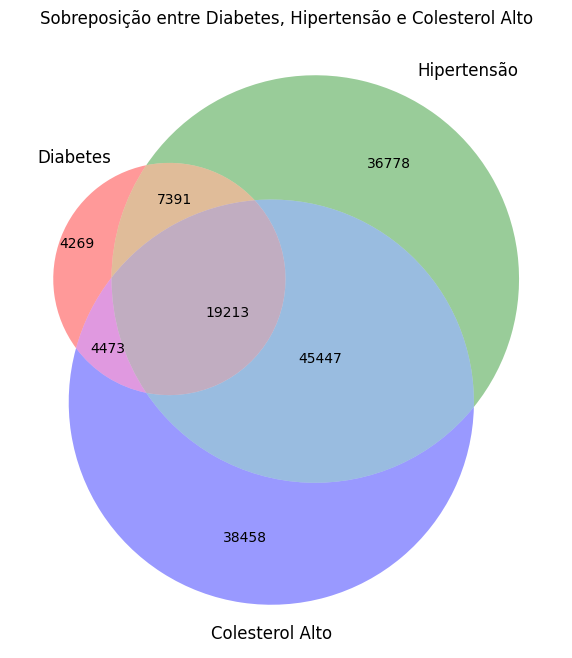

In [21]:
from matplotlib_venn import venn3
import matplotlib.pyplot as plt

# Criando as variáveis booleanas para Diabetes, HighBP e HighChol
diabetes = df_Diabetes['Diabetes_012'] == 2  # Considerando apenas quem tem diabetes (2)
high_bp = df_Diabetes['HighBP'] == 1
high_chol = df_Diabetes['HighChol'] == 1

# Plotando o Venn Diagram para as três condições
plt.figure(figsize=(8, 8))
venn = venn3([set(df_Diabetes[diabetes].index), 
              set(df_Diabetes[high_bp].index), 
              set(df_Diabetes[high_chol].index)], 
             set_labels=('Diabetes', 'Hipertensão', 'Colesterol Alto'))

plt.title('Sobreposição entre Diabetes, Hipertensão e Colesterol Alto')
plt.show()



Este gráfico de Venn revela a sobreposição entre diabetes, hipertensão e colesterol alto. Um grupo de 4.269 individuos apresenta apenas diabetes, enquanto 36.778 indivíduos têm apenas hipertensão, e 38.458 tem apenas de colesterol alto. A interseção mais significativa, envolvendo 19.213 registros, mostra aqueles que tem simultaneamente as três condições, ou seja, diabetes, hipertensão e colesterol alto. Além disso, a interseção entre hipertensão e colesterol alto é notável, com 45.447 pessoas afetadas por ambas as condições. 

Este gráfico de barras agrupadas compara os hábitos de vida (atividade física, consumo de frutas e consumo de vegetais) entre pacientes com três condições de diabetes: Sem Diabetes, Pré-Diabetes e Diabetes. As barras representam a proporção de pessoas em cada grupo que reportaram esses hábitos.

In [23]:
import plotly.express as px
import pandas as pd

# Filtrando apenas as colunas numéricas (habitos de vida)
df_filtered = df_Diabetes[['Diabetes_012', 'PhysActivity', 'Fruits', 'Veggies']]

# Calculando a média apenas para as colunas numéricas
diabetes_0 = df_filtered[df_filtered['Diabetes_012'] == 0][['PhysActivity', 'Fruits', 'Veggies']].mean()
diabetes_1 = df_filtered[df_filtered['Diabetes_012'] == 1][['PhysActivity', 'Fruits', 'Veggies']].mean()
diabetes_2 = df_filtered[df_filtered['Diabetes_012'] == 2][['PhysActivity', 'Fruits', 'Veggies']].mean()

# Criando o dataframe com as proporções calculadas
df_proporcoes = pd.DataFrame({
    'Hábito': ['Atividade Física', 'Consumo de Frutas', 'Consumo de Vegetais'],
    'Sem Diabetes': [diabetes_0['PhysActivity'], diabetes_0['Fruits'], diabetes_0['Veggies']],
    'Pré-Diabetes': [diabetes_1['PhysActivity'], diabetes_1['Fruits'], diabetes_1['Veggies']],
    'Diabetes': [diabetes_2['PhysActivity'], diabetes_2['Fruits'], diabetes_2['Veggies']]
})

# Reshaping os dados para criar o Bar Chart
df_melted = df_proporcoes.melt(id_vars='Hábito', var_name='Condição', value_name='Proporção')

# Criando o Bar Chart Agrupado
fig = px.bar(df_melted, 
             x='Hábito', 
             y='Proporção', 
             color='Condição', 
             barmode='group',  # Agrupamento de barras lado a lado
             title='Comparação de Hábitos de Vida entre Pacientes com Diferentes Condições de Diabetes')

# Ajustando o layout
fig.update_layout(
    yaxis=dict(tickformat=".0%", title='Proporção'),
    xaxis_title='Hábito de Vida',
    legend_title_text='Condição de Diabetes',
    font=dict(size=14)
)

# Exibir o gráfico
fig.show()


O gráfico acima mostra que a atividade física é o hábito mais prevalente entre os registros não diabéticos. O consumo de frutas e vegetais tende a ser menor entre os diabéticos, mas as diferenças são menos acentuadas. 

No gráfico a seguir, foi comparado o acesso à saúde com base em três fatores: verificação de colesterol (CholCheck), acesso a algum tipo de plano de saúde (AnyHealthcare) e dificuldade em consultar um médico devido a custos (NoDocbcCost). 

In [51]:
import plotly.express as px
import pandas as pd

# Definir os rótulos para cada coluna categórica
labels = {
    'CholCheck': 'Verificação de Colesterol',
    'AnyHealthcare': 'Acesso a Plano de Saúde',
    'NoDocbcCost': 'Dificuldade por Custo'
}

# Contagem de valores (0 = Não, 1 = Sim)
cholcheck_counts = df_Diabetes['CholCheck'].value_counts()
anyhealthcare_counts = df_Diabetes['AnyHealthcare'].value_counts()
nodocbccost_counts = df_Diabetes['NoDocbcCost'].value_counts()

# Criando um dataframe para armazenar os resultados
df_acesso_saude = pd.DataFrame({
    'Fator': ['Verificação de Colesterol', 'Verificação de Colesterol', 
              'Acesso a Plano de Saúde', 'Acesso a Plano de Saúde', 
              'Dificuldade por Custo', 'Dificuldade por Custo'],
    'Resposta': ['Sim', 'Não', 'Sim', 'Não', 'Sim', 'Não'],
    'Casos': [cholcheck_counts[1], cholcheck_counts[0], 
              anyhealthcare_counts[1], anyhealthcare_counts[0], 
              nodocbccost_counts[1], nodocbccost_counts[0]]
})

# Criando o Bar Chart agrupado
fig = px.bar(df_acesso_saude, 
             x='Fator', 
             y='Casos', 
             color='Resposta', 
             barmode='group', 
             title='Acesso à Saúde: Verificação de Colesterol, Plano de Saúde e Dificuldade por Custo',
             color_discrete_map={'Sim': 'blue', 'Não': 'red'})  # Mantendo o padrão de cores

# Ajustando o layout
fig.update_layout(
    yaxis_title='Número de Casos',
    xaxis_title='Fatores de Acesso à Saúde',
    legend_title_text='Resposta',
    font=dict(size=14)
)

# Exibir o gráfico
fig.show()



Este gráfico apresenta a análise de três fatores relacionados ao acesso à saúde: Verificação de Colesterol, Acesso a Plano de Saúde e Dificuldade por Custo. A maioria dos pacientes, relatou ter feito a verificação de colesterol, enquanto apenas uma pequena parcela não realizou essa checagem. Da mesma forma, uma proporção alta de pessoas possui plano de saúde, com uma minoria indicando não ter acesso a esse tipo de cobertura. No entanto, o cenário é oposto no quesito Dificuldade por Custo, onde ocorreu mais de 20 mil de ocorrências em dificuldades em acessar cuidados médicos devido ao custo.

In [66]:
import plotly.express as px

# Definir as cores de acordo com o padrão anterior
colors = ['#1f77b4', '#ff7f0e', '#d62728']  # Azul para não diabéticos, laranja para pré-diabéticos e vermelho para diabéticos

# Criar o gráfico de barras com Plotly
fig = px.histogram(df_Diabetes, 
                   x='Smoker', 
                   color='Diabetes_012', 
                   barmode='group', 
                   color_discrete_sequence=colors, 
                   labels={'Smoker': 'Fumante', 'Diabetes_012': 'Status de Diabetes'},
                   title='Distribuição de Fumantes por Status de Diabetes')

# Ajustando os rótulos do eixo y
fig.update_layout(yaxis_title='Contagem', 
                  xaxis_title='Fumante', 
                  legend_title_text='Status de Diabetes')

# Exibir o gráfico
fig.show()


O gráfico de barras é utilizado para comparar proporções entre diferentes grupos. No gráfico de barras que compara fumantes e diabetes, observa-se que existe uma quantidade menor de diabéticos fumantes comparado a não diabéticos fumantes. 

In [27]:
percent_diabetic_smokers = (df_Diabetes[(df_Diabetes['Diabetes_012'] == 2) & (df_Diabetes['Smoker'] == 1)].shape[0] / df_Diabetes[df_Diabetes['Diabetes_012'] == 2].shape[0]) * 100
percent_non_diabetic_smokers = (df_Diabetes[(df_Diabetes['Diabetes_012'] == 0) & (df_Diabetes['Smoker'] == 1)].shape[0] / df_Diabetes[df_Diabetes['Diabetes_012'] == 0].shape[0]) * 100

print('Porcentagem de diabéticos fumantes: ', percent_diabetic_smokers)
print('Porcentagem de não diabéticos fumantes: ', percent_non_diabetic_smokers)

Porcentagem de diabéticos fumantes:  51.82198834380129
Porcentagem de não diabéticos fumantes:  42.968044435501604


A partir dos cálculos de proporção, verificamos que 51.82% dos diabéticos são fumantes, enquanto 42.97% dos não diabéticos são fumantes.  Isso possivelmente indica que existe uma proporção maior de fumantes entre diabéticos do que os não diabéticos presentes no dataset.

# Feature engeneering

# Feature Acesso a Saúde(access_to_healthcare)

A nova feature **"access_to_healthcare"** foi criada para identificar se os indivíduos têm acesso adequado aos cuidados de saúde. Ela combina as informações das colunas **"AnyHealthcare"** e **"NoDocbcCost"** para fornecer uma visão mais clara sobre o acesso aos serviços de saúde.

### Colunas Utilizadas
**AnyHealthcare:** Indica se a pessoa tem algum tipo de cobertura de saúde (0 = Não, 1 = Sim).

**NoDocbcCost:** Indica se a pessoa não conseguiu ver um médico no último ano devido ao custo (0 = Não, 1 = Sim).

In [28]:
#Acesso a Saude
import pandas as pd

df_Diabetes = pd.read_csv('../DiabetesDataSet/diabetes_012_health_indicators_BRFSS2015.csv', low_memory=False)

#Transforma as colunas em valores booleanos
df_Diabetes['AnyHealthcare'] = df_Diabetes['AnyHealthcare'].astype(bool)
df_Diabetes['NoDocbcCost'] = df_Diabetes['NoDocbcCost'].astype(bool)

#Cria a nova coluna 'access_to_healthcare'
df_Diabetes['access_to_healthcare'] = df_Diabetes['AnyHealthcare'] & ~df_Diabetes['NoDocbcCost']

#Apresenta as colunas envolvidas na feature
print(df_Diabetes[['AnyHealthcare', 'NoDocbcCost', 'access_to_healthcare']].head(-5))

        AnyHealthcare  NoDocbcCost  access_to_healthcare
0                True        False                  True
1               False         True                 False
2                True         True                 False
3                True        False                  True
4                True        False                  True
...               ...          ...                   ...
253670           True        False                  True
253671           True         True                 False
253672           True        False                  True
253673           True        False                  True
253674           True        False                  True

[253675 rows x 3 columns]


# Feature Risco cardiovascular("cardio_risk")

A feature **"cardio_risk"** foi criada para calcular um índice de risco cardiovascular com base nas condições de saúde presentes nos dados. Ela combina as informações das colunas **"HighBP"**, **"HighChol"**, **"Stroke"** e **"HeartDiseaseorAttack"** (doença cardíaca coronariana ou infarto do miocárdio). 

### Colunas Utilizadas
**HighBP:** Indica se a pessoa tem pressão alta (0 = Não, 1 = Sim).

**HighChol:** Indica se a pessoa tem colesterol alto (0 = Não, 1 = Sim).

**Stroke:** Indica se a pessoa já teve um derrame (0 = Não, 1 = Sim).

**HeartDiseaseorAttack:** Indica se a pessoa teve doença cardíaca coronariana (CHD) ou infarto do miocárdio (MI) (0 = Não, 1 = Sim).

### Valores da Feature
**0:** Indica que o indivíduo não apresenta nenhuma das condições de risco cardiovascular.

**1:** Indica que o indivíduo apresenta uma condição de risco cardiovascular.

**2:** Indica que o indivíduo apresenta duas condições de risco cardiovascular.

**3:** Indica que o indivíduo apresenta três condições de risco cardiovascular.

**4:** Indica que o indivíduo apresenta as quatro condições de risco cardiovascular.

In [29]:
import pandas as pd

df_Diabetes = pd.read_csv('../DiabetesDataSet/diabetes_012_health_indicators_BRFSS2015.csv', low_memory=False)

#Transforma as colunas em valores booleanos
df_Diabetes['HighBP'] = df_Diabetes['HighBP'].astype(bool)
df_Diabetes['HighChol'] = df_Diabetes['HighChol'].astype(bool)
df_Diabetes['Stroke'] = df_Diabetes['Stroke'].astype(bool)
df_Diabetes['HeartDiseaseorAttack'] = df_Diabetes['HeartDiseaseorAttack'].astype(bool)

#Cria a nova coluna 'cardio_risk'
df_Diabetes['cardio_risk'] = df_Diabetes[['HighBP', 'HighChol', 'Stroke', 'HeartDiseaseorAttack']].sum(axis=1)

#Apresenta as colunas envolvidas na feature
print(df_Diabetes[['HighBP', 'HighChol', 'Stroke', 'HeartDiseaseorAttack', 'cardio_risk']].head(-5))

        HighBP  HighChol  Stroke  HeartDiseaseorAttack  cardio_risk
0         True      True   False                 False            2
1        False     False   False                 False            0
2         True      True   False                 False            2
3         True     False   False                 False            1
4         True      True   False                 False            2
...        ...       ...     ...                   ...          ...
253670    True      True   False                  True            3
253671    True      True    True                  True            4
253672    True     False   False                  True            2
253673    True     False   False                 False            1
253674   False     False   False                 False            0

[253675 rows x 5 columns]
